<a href="https://colab.research.google.com/github/Aikhusy/PCVK/blob/master/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [50]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


masukkan nilai kecerahan : 50


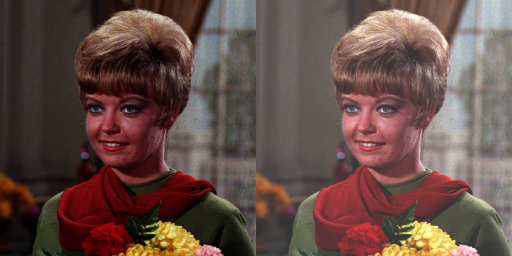

In [51]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

try:
  brightness=int(input('masukkan nilai kecerahan : '))
except ValueError:
  print('error, not a number')

original =cv2.imread('/content/drive/MyDrive/PCVK/female.tiff')
brightness_image = np.zeros(original.shape,original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c]=np.clip(original[y,x,c] + brightness,0,255)

final_frame=cv2.hconcat ((original,brightness_image))
cv2_imshow(final_frame)

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang
terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

**MENGGUNAKAN FUNGSI BAWAAN OPENCV**

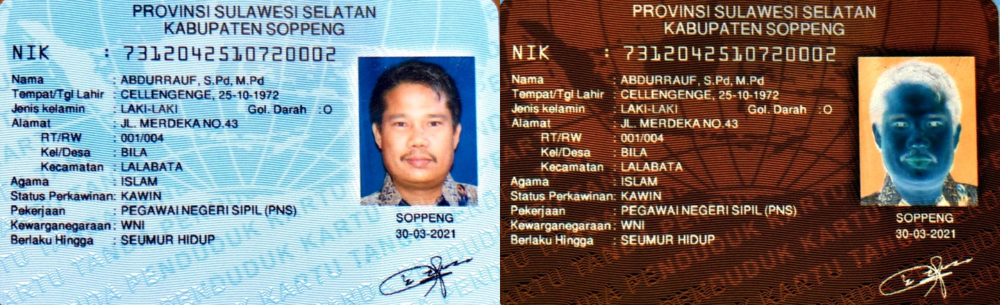

In [65]:
path='/content/drive/MyDrive/PCVK/KTP2.jpeg'
image=cv2.imread(path)
inverted_image = cv2.bitwise_not(image)

invertedFrame=cv2.hconcat((image,inverted_image))
cv2_imshow(invertedFrame)

**MENGGUNAKAN RUMUS INVERT**

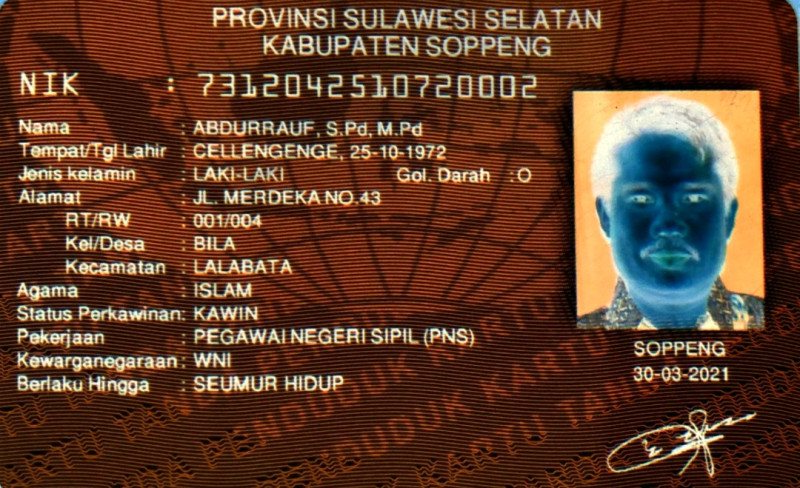

In [66]:
path='/content/drive/MyDrive/PCVK/KTP2.jpeg'
image = cv2.imread(path)
invert = np.zeros(image.shape,image.dtype)
for y in range(image.shape[0]):
    for x in range(image.shape[1]):
        for c in range(image.shape[2]):
            invert[y,x,c]=np.clip(255 - image[y,x,c] ,0,255)

cv2_imshow(invert)

Implementasikan transformasi contrast pada Google Colaboratory menggunakan
formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga
menghasilkan keluaran seperti berikut:

**MENGGUNAKAN RUMUS**

masukkan nilai kecerahan [-255 , 255] : 50
masukkan nilai kontrast [1.0 - 3.0] : 2


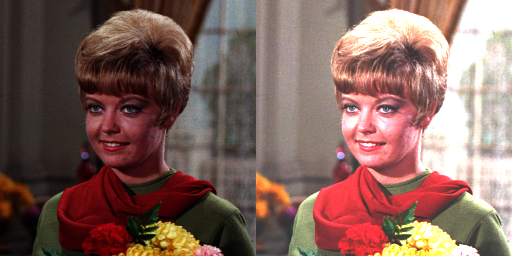

In [54]:
femalePath='/content/drive/MyDrive/PCVK/female.tiff'
try:
  brightness=int(input('masukkan nilai kecerahan [-255 , 255] : '))
  contrast=int(input('masukkan nilai kontrast [1.0 - 3.0] : '))
except ValueError:
  print('error, not a number')

original =cv2.imread(femalePath)
brightness_image = np.zeros(original.shape,original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c]=np.clip(contrast * original[y,x,c] + brightness,0,255)

final_frame=cv2.hconcat ((original,brightness_image))
cv2_imshow(final_frame)

**MENGGUNAKAN FUNGSI BAWAAN**

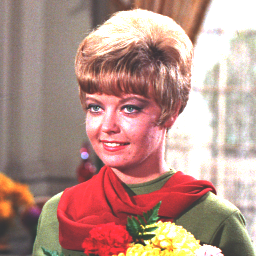

In [55]:
editedImage=cv2.convertScaleAbs(original, alpha=contrast, beta=brightness)
cv2_imshow(editedImage)

Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:

masukkan nilai kecerahan [-255 , 255] : 50


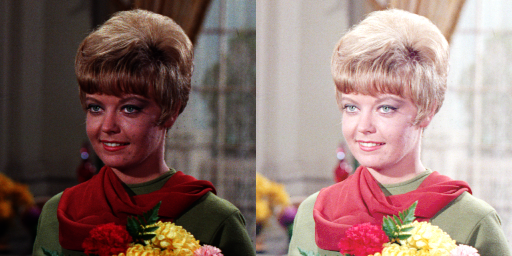

In [56]:
import numpy as np
def logaritmikBrightness(image,kecerahan):
    brightness_image = np.zeros(image.shape,image.dtype)

    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            for c in range(image.shape[2]):
                brightness_image[y,x,c]=np.clip(kecerahan * np.log(1 + original[y,x,c]),0,255)

    return brightness_image

try:
  brightness=int(input('masukkan nilai kecerahan [-255 , 255] : '))
except ValueError:
  print('error, not a number')

converted= logaritmikBrightness(original,brightness)
final_frame=cv2.hconcat ((original,converted))
cv2_imshow(final_frame)

Implementasikan transformasi grayscale menggunakan metode averaging, lightness,
dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada
bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

**a. Averaging**

<ipython-input-62-3a2e5f338494>:10: RuntimeWarning: overflow encountered in ubyte_scalars
  average = (red + green + blue) / 3


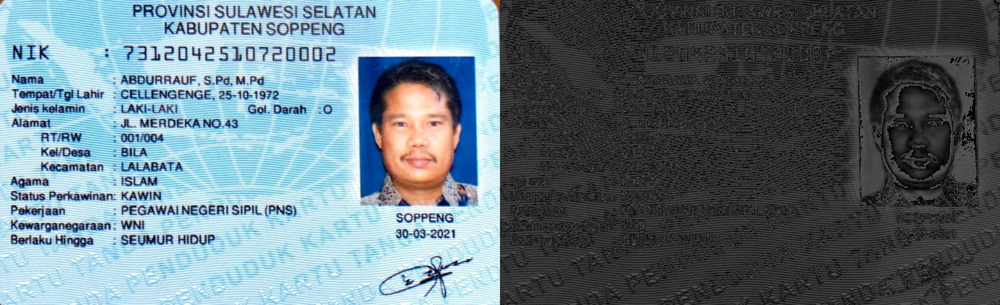

In [62]:


def averageBrightness(image):
    brightness_image = np.zeros(image.shape,image.dtype)

    for ye in range(image.shape[0]):
        for xe in range(image.shape[1]):
            for c in range(image.shape[2]):
                red = image[ye, xe, 2]  # Saluran merah (indeks 2)
                green = image[ye, xe, 1]  # Saluran hijau (indeks 1)
                blue = image[ye, xe, 0]  # Saluran biru (indeks 0)
                average = (red + green + blue) / 3
                brightness_image[ye, xe, c] = np.clip(average, 0, 255)
    return brightness_image

path='/content/drive/MyDrive/PCVK/KTP2.jpeg'
ktp = cv2.imread(path)
converted= averageBrightness(ktp)

final_frame=cv2.hconcat ((ktp,converted))
cv2_imshow(final_frame)

**b. Lightness**

<ipython-input-63-546d6021a565>:10: RuntimeWarning: overflow encountered in ubyte_scalars
  maxmin=(max(red,green,blue)+min(red,green,blue))/2


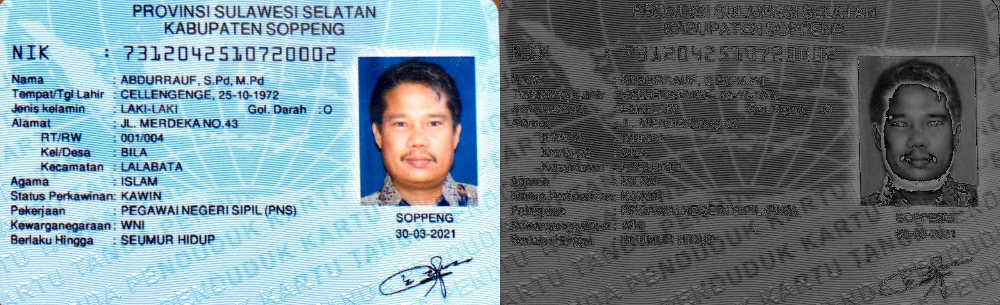

In [63]:
def grayscaleLightness(image):
    brightness_image = np.zeros(image.shape,image.dtype)

    for ye in range(image.shape[0]):
        for xe in range(image.shape[1]):
            for c in range(image.shape[2]):
                red = image[ye, xe, 2]  # Saluran merah (indeks 2)
                green = image[ye, xe, 1]  # Saluran hijau (indeks 1)
                blue = image[ye, xe, 0]  # Saluran biru (indeks 0)
                maxmin=(max(red,green,blue)+min(red,green,blue))/2
                brightness_image[ye, xe, c] = np.clip(maxmin, 0, 255)
    return brightness_image

path='/content/drive/MyDrive/PCVK/KTP2.jpeg'
ktp = cv2.imread(path)
converted= grayscaleLightness(ktp)

final_frame=cv2.hconcat ((ktp,converted))
cv2_imshow(final_frame)

**c. Luminance**

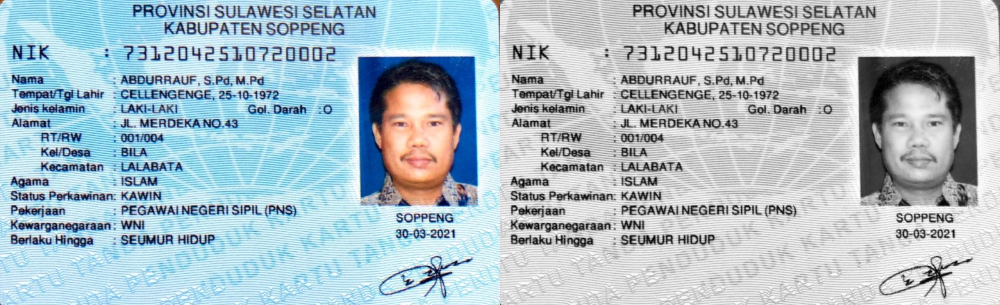

In [64]:
def grayscaleLuminance(image):
    brightness_image = np.zeros(image.shape,image.dtype)

    for ye in range(image.shape[0]):
        for xe in range(image.shape[1]):
            for c in range(image.shape[2]):
                red = image[ye, xe, 2]*0.21  # Saluran merah (indeks 2)
                green = image[ye, xe, 1]*0.72  # Saluran hijau (indeks 1)
                blue = image[ye, xe, 0]*0.07  # Saluran biru (indeks 0)
                maxmin=red+green+blue
                brightness_image[ye, xe, c] = np.clip(maxmin, 0, 255)
    return brightness_image

path='/content/drive/MyDrive/PCVK/KTP2.jpeg'
ktp = cv2.imread(path)
converted= grayscaleLuminance(ktp)

final_frame=cv2.hconcat ((ktp,converted))
cv2_imshow(final_frame)

**Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal,
tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna
biru menjadi grayscale seperti pada contoh berikut:**

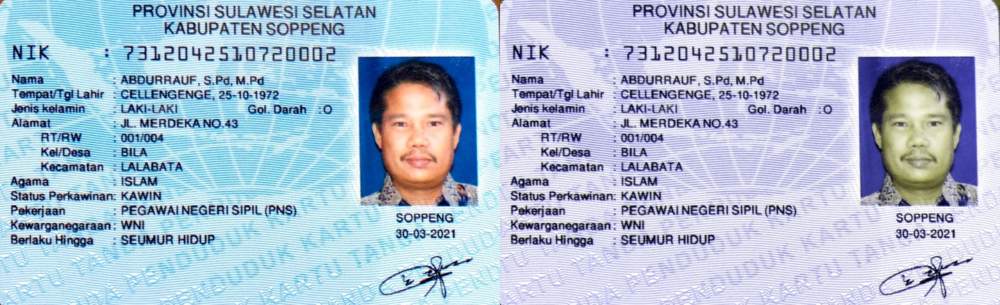

In [61]:
def grayscalePilihan(image):
    grayscale_image = np.zeros(image.shape,image.dtype)


    for ye in range(image.shape[0]):
        for xe in range(image.shape[1]):
            red = image[ye, xe, 2]*0.21  # Saluran merah (indeks 2)
            green = image[ye, xe, 1]*0.72  # Saluran hijau (indeks 1)
            blue = image[ye, xe, 0]*0.07  # Saluran biru (indeks 0)

            maxmin=red+green+blue

            grayscale_image[ye, xe, 0] = image[ye, xe, 0]# Saluran biru
            grayscale_image[ye, xe, 1] = np.clip(maxmin, 0, 255) # Saluran hijau
            grayscale_image[ye, xe, 2] = np.clip(maxmin, 0, 255)  # Saluran merah

    return grayscale_image

path='/content/drive/MyDrive/PCVK/KTP2.jpeg'
ktp = cv2.imread(path)
converted= grayscalePilihan(ktp)

final_frame=cv2.hconcat ((ktp,converted))
cv2_imshow(final_frame)